# scAdam predict

[**scAdam**](https://scparadise.readthedocs.io/en/latest/theory.html#scadam-models)  is specifically developed for annotating cell types, especially focusing on rare cell types that may be underrepresented in the dataset.

**Advantages**
1. scAdam not only detects all cell types in any test dataset but also generates reproducible results, which is an important aspect for reliable biological interpretation.
2) It enables multitasking by allowing the researchers to extract individual cell types for targeted investigations.

**Integration with Other Tools:** <br>
scAdam is part of a bigger toolkit that includes other tools, such as [**scEve**](https://scparadise.readthedocs.io/en/latest/theory.html#sceve-models) for surface protein prediction and [**scNoah**](https://scparadise.readthedocs.io/en/latest/theory.html#scnoah-metrics) for benchmarking, making it a comprehensive solution for single-cell analysis.

In [1]:
# Python packages
import warnings
warnings.simplefilter('ignore')

import scanpy as sc
import scparadise
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

sc.set_figure_params(dpi = 120)

## Recommendations about dataset 
Our models trained using shifted logarithm normalized data. <br>
We recommend shifted logarithm data normalization method to proper usage of our models: <br>
sc.pp.normalize_total(adata, target_sum=None) <br>
sc.pp.log1p(adata) <br>
adata.raw = adata

In [2]:
# Load dataset from 10x Genomics
url = "https://cf.10xgenomics.com/samples/cell-exp/6.1.0/10k_PBMC_3p_nextgem_Chromium_X/10k_PBMC_3p_nextgem_Chromium_X_filtered_feature_bc_matrix.h5"
adata = sc.read_10x_h5("dataset.h5", backup_url = url)
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 11996 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

## QC

In [3]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [4]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

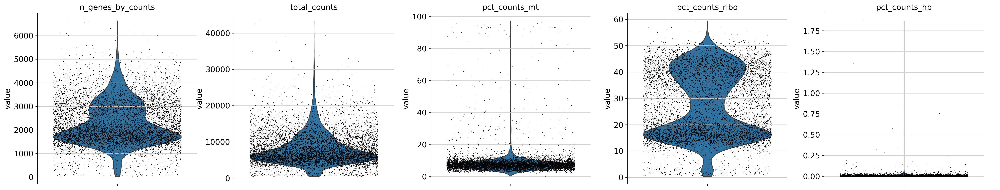

In [5]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", 'pct_counts_ribo', 'pct_counts_hb'],
    jitter=0.4,
    multi_panel=True,
)

In [6]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [7]:
# Detect doublets
sc.pp.scrublet(adata)

In [8]:
# Remove doublets + other QC metrics
adata = adata[adata.obs['predicted_doublet'] == False]
sc.pp.filter_cells(adata, max_genes = 5000)
sc.pp.filter_cells(adata, max_counts = 20000)
adata = adata[adata.obs['pct_counts_mt'] < 15]

## Normalization, HVG, neighbors, PCA, UMAP
We recommend using shifted logarithm data normalization as described here.

In [9]:
# Saving count data
adata.layers["counts"] = adata.X.copy()
# Normalization (shifted logarithm)
sc.pp.normalize_total(adata, target_sum=None)
sc.pp.log1p(adata) 
# scParadise use normalized data in adata.raw!!!
adata.raw = adata
# HVG
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
# PCA
sc.tl.pca(adata)
# Nearest neighbors analysis
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
# UMAP
sc.tl.umap(adata)

## scParadise prediction (scAdam)

In [10]:
# Available models for cell type annotation
df = scparadise.scadam.available_models()
# Show models related to humans
df_human = df[df['Tissue/Model name'].str.startswith('Human_')]
df_human

,Tissue/Model name,Description,Suspension,Accuracy,Balanced Accuracy,Number of Levels
0,Human_PBMC,Peripheral blood mononuclear cells of healthy ...,cells,0.979,0.979,3
1,Human_BMMC,Bone marrow mononuclear cell of healthy adults,cells,0.947,0.942,3
2,Human_Heart,Human heart CITE-seq analysis of healthy and d...,cells,0.957,0.956,2
3,Human_Lung,Core Human Lung Cell Atlas,cells,0.965,0.964,5
4,Human_Lung_Cancer,Extended single-cell lung cancer atlas (LuCA),cells,0.937,0.936,3
5,Human_oropharyngeal_SCC,Oropharyngeal HPV+/HPV- squamous cell carcinom...,cells,0.972,0.968,2
6,Human_Retina,Single cell atlas of the human retina,cells,0.984,0.979,4


In [11]:
# Download model for cell type prediction
scparadise.scadam.download_model('Human_PBMC', save_path='')

In [12]:
# Predict cell types using trained model
adata = scparadise.scadam.predict(adata, 
                                  path_model = 'Human_PBMC_scAdam/')

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities


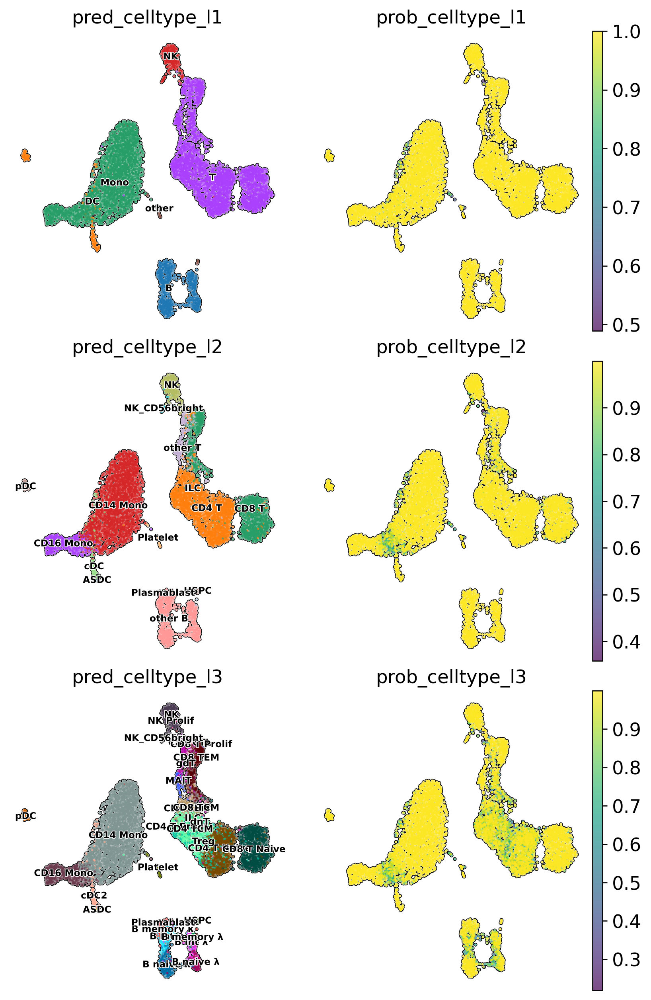

In [13]:
# Visualise predicted cell types levels and prediction probabilities
sc.pl.embedding(adata, 
                color = [
                    'pred_celltype_l1',
                    'prob_celltype_l1',
                    'pred_celltype_l2',
                    'prob_celltype_l2',
                    'pred_celltype_l3',
                    'prob_celltype_l3'
                ],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                legend_loc = 'on data',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols = 2,
                wspace = 0, 
                hspace = 0.1)

## Check prediction results

In [14]:
# Visualization of marker genes of some predicted cell types
marker_genes = {
    "CD8 T Naive" : ['CD8B', 'TRABD2A', 'CCR7'],
    "CD4 T Naive" : ['CD4', 'TRABD2A', 'CCR7'],
    "CD4 TEM": ['CD4', "GZMK", 'CCL5'],
    "Treg": ['RTKN2', 'FOXP3', 'IL2RA'],
    "B memory": ['SSPN', 'IGHA2', 'AIM2'],
    "B naive": ['TCL1A', 'IGHD'],
    "NK": ["FCER1G", 'KLRF1'],
    "NK_CD56bright": ['GZMK', 'XCL1'],
    "CD14 Mono": ['CD14', 'LYZ'],
    "CD16 Mono": ['FCGR3A', 'MS4A7'],   
    "MAIT": ['CXCR6', 'SLC4A10', 'GZMK'],   
    "Platelet": ['PPBP', 'PF4', 'GP9'],
    "pDC": ['SCT', 'CLEC4C', 'IRF8']
}

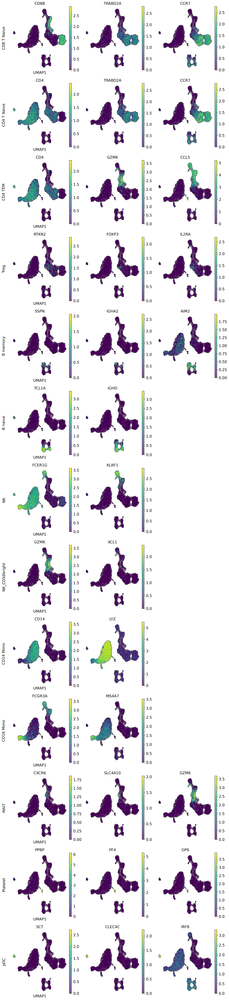

In [15]:
# Make Axes
# Number of needed rows and columns (based on the row with the most columns)
nrow = len(marker_genes)
ncol = max([len(vs) for vs in marker_genes.values()])
fig, axs = plt.subplots(nrow, ncol, figsize=(4 * ncol, 4 * nrow))
# Plot expression for every marker on the corresponding Axes object
for row_idx, (cell_type, markers) in enumerate(marker_genes.items()):
    col_idx = 0
    for marker in markers:
        ax = axs[row_idx, col_idx]
        sc.pl.umap(adata, color=marker, ax=ax, show=False, cmap='viridis', frameon=False, 
                   add_outline=True, ncols=3, s=20)
        # Add cell type as row label - here we simply add it as ylabel of
        # the first Axes object in the row
        if col_idx == 0:
            # We disabled axis drawing in UMAP to have plots without background and border
            # so we need to re-enable axis to plot the ylabel
            ax.axis("on")
            ax.tick_params(
                top="off",
                bottom="off",
                left="off",
                right="off",
                labelleft="on",
                labelbottom="off",
            )
            ax.set_ylabel(cell_type + "\n", rotation=90, fontsize=14)
            ax.set(frame_on=False)
        col_idx += 1
    # Remove unused column Axes in the current row
    while col_idx < ncol:
        axs[row_idx, col_idx].remove()
        col_idx += 1
# Alignment within the Figure
fig.tight_layout()

In [16]:
# Save anndata with predicted annotations
adata.write_h5ad('adata_predicted.h5ad')

In [17]:
import session_info
session_info.show()